<a href="https://colab.research.google.com/github/tleyden/FruitPunch_AI_Bootcamp/blob/main/FruitPunch_Capstone_Project_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Pip installs

In [ ]:
!apt install -y jq
!pip install pycocotools
!python -m pip install pyyaml==5.1
!pip install wandb -qU


Reading package lists... Done
Building dependency tree       
Reading state information... Done
jq is already the newest version (1.5+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 20 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Imports

In [ ]:
import os
from matplotlib import pyplot as plt
import cv2

from pycocotools.coco import COCO
import skimage.io as io
from pathlib import Path

import sys, distutils.core
from google.colab.patches import cv2_imshow


## Download zips from google bucket

In [ ]:
from google.colab import auth
auth.authenticate_user()

if not os.path.exists("Labeled data-20211126T095740Z-001.zip"):
    !gsutil cp "gs://fruitpunch-ai-tleyden/Labeled data-20211126T095740Z-001.zip" .
if not os.path.exists("Labeled data-20211126T095740Z-002.zip"):
    !gsutil cp "gs://fruitpunch-ai-tleyden/Labeled data-20211126T095740Z-002.zip" .


In [ ]:
if not os.path.exists("labeled_data"):
    !unzip -q "Labeled data-20211126T095740Z-001.zip"
    !unzip -q "Labeled data-20211126T095740Z-002.zip"

## Re-arrange directories to match expected structure

In [ ]:
if not os.path.exists("labeled_data"):
    !mv "Labeled data" labeled_data
if not os.path.exists("labeled_data/images/test"):
    !mkdir labeled_data/images/test 
    !mv labeled_data/images/*.PNG labeled_data/images/test 

## Set path variables

In [ ]:
DATA_PATH = '/content/labeled_data/'
IMAGES_PATH = DATA_PATH + 'images/'
LABELS_PATH = DATA_PATH + 'annotations/'

# Get paths to IMAGE directories
TRAIN_IMAGES_PATH = IMAGES_PATH + 'train/'
TEST_IMAGES_PATH = IMAGES_PATH + 'test/'
VAL_IMAGES_PATH = IMAGES_PATH + 'val/'

TRAIN_LABELS = LABELS_PATH + 'instances_train.json'
TEST_LABELS = LABELS_PATH + 'instances_test_dataset.json'
VAL_LABELS = LABELS_PATH + 'instances_val.json'

## Define model

### Install detectron2

In [ ]:
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

fatal: destination path 'detectron2' already exists and is not an empty directory.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Show versions

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)


nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


### Import modules

In [ ]:
# import detectron2 modules
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

import json, random
from detectron2.data.datasets import register_coco_instances


### Register coco instances

In [ ]:
register_coco_instances("my_dataset_train", {}, TRAIN_LABELS, TRAIN_IMAGES_PATH)
register_coco_instances("my_dataset_test", {}, TEST_LABELS, TEST_IMAGES_PATH)
register_coco_instances("my_dataset_val", {}, VAL_LABELS, VAL_IMAGES_PATH)

### Get dictionary of filenames and image ids

In [ ]:

# # get dictionary of filename and image ids
# def get_filenames(filename_dict, json_file):
#     with open(json_file) as f:
#       imgs_anns = json.load(f)
#     for idx in imgs_anns["images"]:
#       filename = idx["file_name"]
#       img_id = idx["id"]
#       filename_dict[img_id] = filename
#     return filename_dict

# filename_dict = {}
# get_filenames(filename_dict, TRAIN_LABELS)
# get_filenames(filename_dict, TEST_LABELS)
# get_filenames(filename_dict, VAL_LABELS)

{124: 'video53_1_000123.PNG',
 125: 'video53_1_000124.PNG',
 126: 'video53_1_000125.PNG',
 127: 'video53_1_000126.PNG',
 128: 'video53_1_000127.PNG',
 129: 'video53_1_000128.PNG',
 131: 'video53_1_000130.PNG',
 133: 'video53_1_000132.PNG',
 134: 'video53_1_000133.PNG',
 135: 'video53_1_000134.PNG',
 136: 'video53_1_000135.PNG',
 137: 'video53_1_000136.PNG',
 138: 'video53_1_000137.PNG',
 139: 'video53_1_000138.PNG',
 140: 'video53_1_000139.PNG',
 141: 'video53_1_000140.PNG',
 142: 'video53_1_000141.PNG',
 143: 'video53_1_000142.PNG',
 144: 'video53_1_000143.PNG',
 145: 'video53_1_000144.PNG',
 147: 'video53_1_000146.PNG',
 148: 'video53_1_000147.PNG',
 149: 'video53_1_000148.PNG',
 150: 'video53_1_000149.PNG',
 151: 'video53_1_000150.PNG',
 152: 'video53_1_000151.PNG',
 154: 'video53_1_000153.PNG',
 155: 'video53_1_000154.PNG',
 156: 'video53_1_000155.PNG',
 157: 'video53_1_000156.PNG',
 158: 'video53_1_000157.PNG',
 159: 'video53_1_000158.PNG',
 160: 'video53_1_000159.PNG',
 161: 'vid

### Visualize training data

loading annotations into memory...
Done (t=0.32s)
creating index...
index created!
[12/14 22:45:05 d2.data.datasets.coco]: Loaded 13111 images in COCO format from /content/labeled_data/annotations/instances_train.json


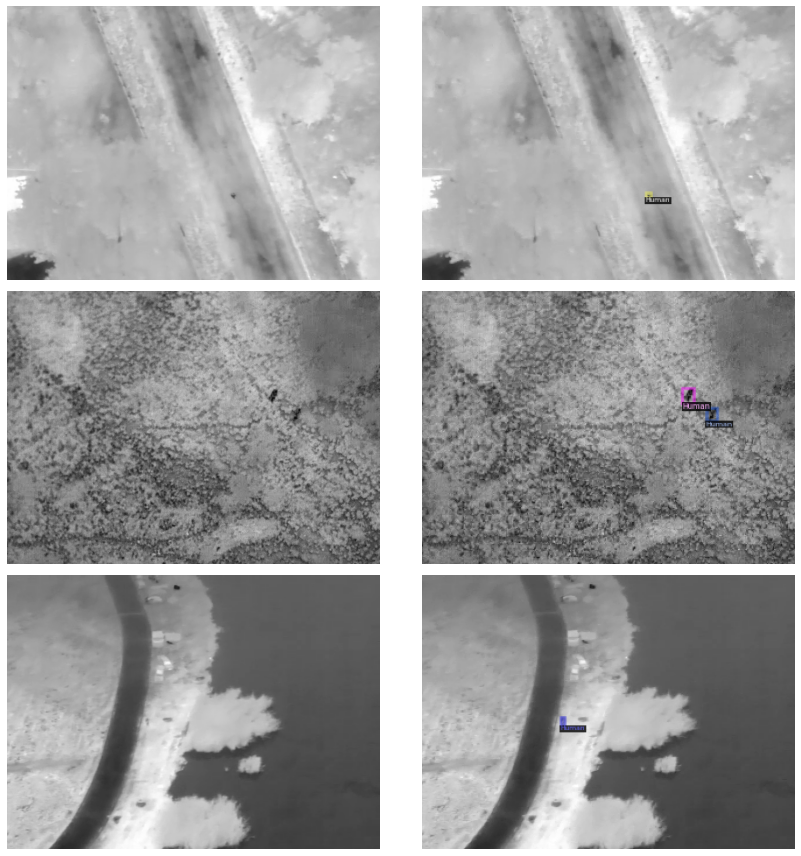

In [ ]:

# coco = COCO(TRAIN_LABELS) # return dictionary of the dataset
# img_IDs = coco.getImgIds() # get image IDs
# imgs = coco.loadImgs(img_IDs[1100:1103]) # load images

# # visualize training data
# my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
# dataset_dicts = DatasetCatalog.get("my_dataset_train")

# _, axs = plt.subplots(len(imgs), 2, figsize=(12, 12))
# for d, ax in zip(random.sample(dataset_dicts, 3), axs):
#     id = d["image_id"]
#     filename = filename_dict[id]
#     img = cv2.imread(d["file_name"])
#     visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
#     vis = visualizer.draw_dataset_dict(d)
#     # cv2_imshow(vis.get_image()[:, :, ::-1])
#     ax[0].imshow(img); ax[0].axis('off')
#     ax[1].imshow(vis.get_image()[:, :, ::-1]); ax[1].axis('off')
#     plt.tight_layout()

## Training

fine-tune a COCO-pretrained model on the custom dataset


### Create config

In [ ]:
from detectron2.engine import DefaultTrainer

# pretrained_model = "faster_rcnn_R_50_FPN_1x.yaml"
pretrained_model = "faster_rcnn_R_101_FPN_3x.yaml"
batch_size = {
    "faster_rcnn_R_50_FPN_1x.yaml": 8,
    "faster_rcnn_R_101_FPN_3x.yaml": 4
}

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(f"COCO-Detection/{pretrained_model}"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(f"COCO-Detection/{pretrained_model}")  # Let training initialize from model zoo

# SOLVER.IMS_PER_BATCH is what's commonly known as batch size in deep learning and refers to the number of training examples utilized in one iteration.
# REF: https://stackoverflow.com/questions/72637875/detectron2-difference-between-solver-ims-per-batch-and-model-roi-heads-batch-siz
#cfg.SOLVER.IMS_PER_BATCH = 4 # - underutilize gpu, only 7/15GB used
cfg.SOLVER.IMS_PER_BATCH = batch_size[pretrained_model]

cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 2000 #adjust up if val mAP is still rising, adjust down if overfit

# The learning rate will be reduced by GAMMA at each of the solver steps listed below
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05

# MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE is a parameter that is used to sample a subset of proposals coming out of RPN to calculate cls and reg loss during training.
# REF: https://stackoverflow.com/questions/72637875/detectron2-difference-between-solver-ims-per-batch-and-model-roi-heads-batch-siz
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 16

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

cfg.TEST.EVAL_PERIOD = 500

### Define cocotrainer

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

### Run training

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/14 22:45:33 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[12/14 22:45:38 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/14 22:46:04 d2.utils.events]:  eta: 0:38:28  iter: 19  total_loss: 1.865  loss_cls: 0.7769  loss_box_reg: 0.7371  loss_rpn_cls: 0.272  loss_rpn_loc: 0.04342  time: 1.1746  data_time: 0.0397  lr: 1.931e-06  max_mem: 5829M
[12/14 22:46:29 d2.utils.events]:  eta: 0:40:32  iter: 39  total_loss: 1.747  loss_cls: 0.7518  loss_box_reg: 0.7655  loss_rpn_cls: 0.1861  loss_rpn_loc: 0.03179  time: 1.2049  data_time: 0.0190  lr: 2.911e-06  max_mem: 5829M
[12/14 22:46:54 d2.utils.events]:  eta: 0:40:23  iter: 59  total_loss: 1.72  loss_cls: 0.7127  loss_box_reg: 0.7915  loss_rpn_cls: 0.09962  loss_rpn_loc: 0.0409  time: 1.2243  data_time: 0.0189  lr: 3.891e-06  max_mem: 5829M
[12/14 22:47:20 d2.utils.events]:  eta: 0:40:37  iter: 79  total_loss: 1.674  loss_cls: 0.6729  loss_box_reg: 0.8394  loss_rpn_cls: 0.06086  loss_rpn_loc: 0.0452  time: 1.2472  data_time: 0.0203  lr: 4.871e-06  max_mem: 5829M
[12/14 22:47:46 d2.utils.events]:  eta: 0:40:23  iter: 99  total_loss: 1.637  loss_cls: 0.6312  lo

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[12/14 22:56:35 d2.evaluation.evaluator]: Inference done 11/3278. Dataloading: 0.0012 s/iter. Inference: 0.1546 s/iter. Eval: 0.0004 s/iter. Total: 0.1562 s/iter. ETA=0:08:30
[12/14 22:56:40 d2.evaluation.evaluator]: Inference done 44/3278. Dataloading: 0.0019 s/iter. Inference: 0.1525 s/iter. Eval: 0.0004 s/iter. Total: 0.1550 s/iter. ETA=0:08:21
[12/14 22:56:46 d2.evaluation.evaluator]: Inference done 77/3278. Dataloading: 0.0020 s/iter. Inference: 0.1523 s/iter. Eval: 0.0004 s/iter. Total: 0.1548 s/iter. ETA=0:08:15
[12/14 22:56:51 d2.evaluation.evaluator]: Inference done 110/3278. Dataloading: 0.0020 s/iter. Inference: 0.1522 s/iter. Eval: 0.0004 s/iter. Total: 0.1547 s/iter. ETA=0:08:10
[12/14 22:56:56 d2.evaluation.evaluator]: Inference done 143/3278. Dataloading: 0.0020 s/iter. Inference: 0.1522 s/iter. Eval: 0.0004 s/iter. Total: 0.1547 s/iter. ETA=0:08:05
[12/14 22:57:01 d2.evaluation.evaluator]: Inference done 176/3278. Dataloading: 0.0020 s/iter. Inference: 0.1522 s/iter. Ev

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[12/14 23:16:35 d2.evaluation.evaluator]: Inference done 11/3278. Dataloading: 0.0010 s/iter. Inference: 0.1551 s/iter. Eval: 0.0003 s/iter. Total: 0.1565 s/iter. ETA=0:08:31
[12/14 23:16:40 d2.evaluation.evaluator]: Inference done 44/3278. Dataloading: 0.0018 s/iter. Inference: 0.1534 s/iter. Eval: 0.0004 s/iter. Total: 0.1558 s/iter. ETA=0:08:23
[12/14 23:16:46 d2.evaluation.evaluator]: Inference done 77/3278. Dataloading: 0.0021 s/iter. Inference: 0.1534 s/iter. Eval: 0.0004 s/iter. Total: 0.1560 s/iter. ETA=0:08:19
[12/14 23:16:51 d2.evaluation.evaluator]: Inference done 110/3278. Dataloading: 0.0022 s/iter. Inference: 0.1531 s/iter. Eval: 0.0004 s/iter. Total: 0.1558 s/iter. ETA=0:08:13
[12/14 23:16:56 d2.evaluation.evaluator]: Inference done 143/3278. Dataloading: 0.0023 s/iter. Inference: 0.1530 s/iter. Eval: 0.0004 s/iter. Total: 0.1557 s/iter. ETA=0:08:08
[12/14 23:17:01 d2.evaluation.evaluator]: Inference done 176/3278. Dataloading: 0.0023 s/iter. Inference: 0.1530 s/iter. Ev

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[12/14 23:36:42 d2.evaluation.evaluator]: Inference done 11/3278. Dataloading: 0.0012 s/iter. Inference: 0.1543 s/iter. Eval: 0.0003 s/iter. Total: 0.1558 s/iter. ETA=0:08:28
[12/14 23:36:48 d2.evaluation.evaluator]: Inference done 44/3278. Dataloading: 0.0022 s/iter. Inference: 0.1529 s/iter. Eval: 0.0003 s/iter. Total: 0.1555 s/iter. ETA=0:08:23
[12/14 23:36:53 d2.evaluation.evaluator]: Inference done 77/3278. Dataloading: 0.0023 s/iter. Inference: 0.1527 s/iter. Eval: 0.0003 s/iter. Total: 0.1555 s/iter. ETA=0:08:17
[12/14 23:36:58 d2.evaluation.evaluator]: Inference done 110/3278. Dataloading: 0.0023 s/iter. Inference: 0.1526 s/iter. Eval: 0.0003 s/iter. Total: 0.1554 s/iter. ETA=0:08:12
[12/14 23:37:03 d2.evaluation.evaluator]: Inference done 143/3278. Dataloading: 0.0024 s/iter. Inference: 0.1526 s/iter. Eval: 0.0003 s/iter. Total: 0.1555 s/iter. ETA=0:08:07
[12/14 23:37:08 d2.evaluation.evaluator]: Inference done 176/3278. Dataloading: 0.0024 s/iter. Inference: 0.1525 s/iter. Ev

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[12/14 23:56:44 d2.evaluation.evaluator]: Inference done 11/3278. Dataloading: 0.0019 s/iter. Inference: 0.1523 s/iter. Eval: 0.0003 s/iter. Total: 0.1544 s/iter. ETA=0:08:24
[12/14 23:56:49 d2.evaluation.evaluator]: Inference done 44/3278. Dataloading: 0.0020 s/iter. Inference: 0.1517 s/iter. Eval: 0.0003 s/iter. Total: 0.1540 s/iter. ETA=0:08:18
[12/14 23:56:54 d2.evaluation.evaluator]: Inference done 77/3278. Dataloading: 0.0021 s/iter. Inference: 0.1518 s/iter. Eval: 0.0003 s/iter. Total: 0.1543 s/iter. ETA=0:08:13
[12/14 23:56:59 d2.evaluation.evaluator]: Inference done 110/3278. Dataloading: 0.0024 s/iter. Inference: 0.1518 s/iter. Eval: 0.0003 s/iter. Total: 0.1546 s/iter. ETA=0:08:09
[12/14 23:57:04 d2.evaluation.evaluator]: Inference done 143/3278. Dataloading: 0.0024 s/iter. Inference: 0.1520 s/iter. Eval: 0.0003 s/iter. Total: 0.1548 s/iter. ETA=0:08:05
[12/14 23:57:09 d2.evaluation.evaluator]: Inference done 176/3278. Dataloading: 0.0023 s/iter. Inference: 0.1520 s/iter. Ev

### Display tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output


<IPython.core.display.Javascript object>

# Eval test set

## Get test set mAP score

This code was adapted from the [sample colab notebook](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=0e4vdDIOXyxF)

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator("my_dataset_test", output_dir="./output_evaluator")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[12/15 01:23:00 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

## Draw predicted bounding boxes on test set

[12/15 01:55:28 d2.data.datasets.coco]: Loaded 1900 images in COCO format from /content/labeled_data/annotations/instances_test_dataset.json
my_dataset_test_metadata: Metadata(evaluator_type='coco', image_root='/content/labeled_data/images/test/', json_file='/content/labeled_data/annotations/instances_test_dataset.json', name='my_dataset_test', thing_classes=['Human', 'Rock', 'Animal'], thing_dataset_id_to_contiguous_id={1: 0, 2: 1, 3: 2})
random_test_sample: {'file_name': '/content/labeled_data/images/test/video82_2_000600.PNG', 'height': 470, 'width': 640, 'image_id': 2659, 'annotations': [{'iscrowd': 0, 'bbox': [336.70000000000005, 318.07, 6.839999999999918, 6.699999999999989], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [253.39999999999998, 195.89, 6.0400000000000205, 7.659999999999997], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [264.76, 208.62, 8.839999999999975, 8.47999999999999], 'category_id': 0, 'bbox_mode':

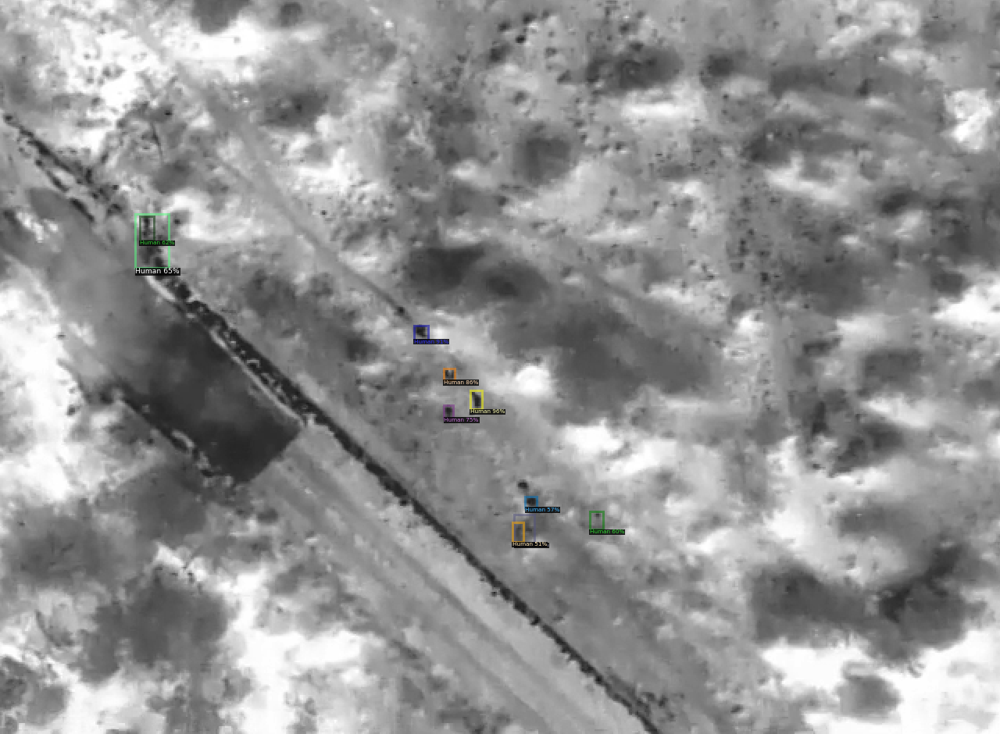

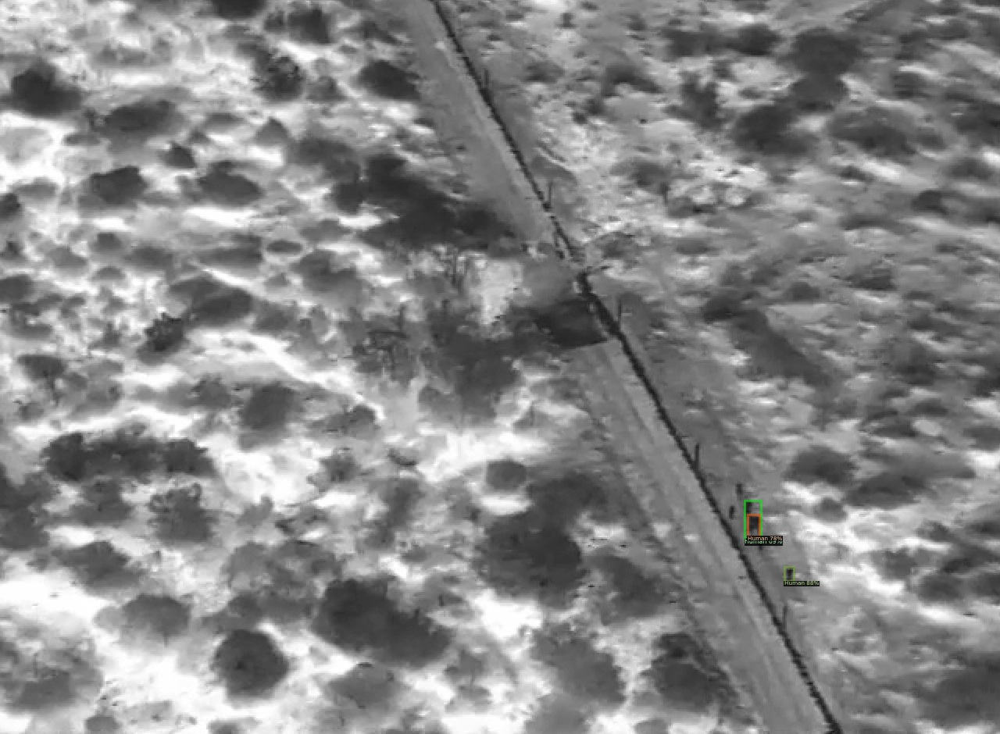

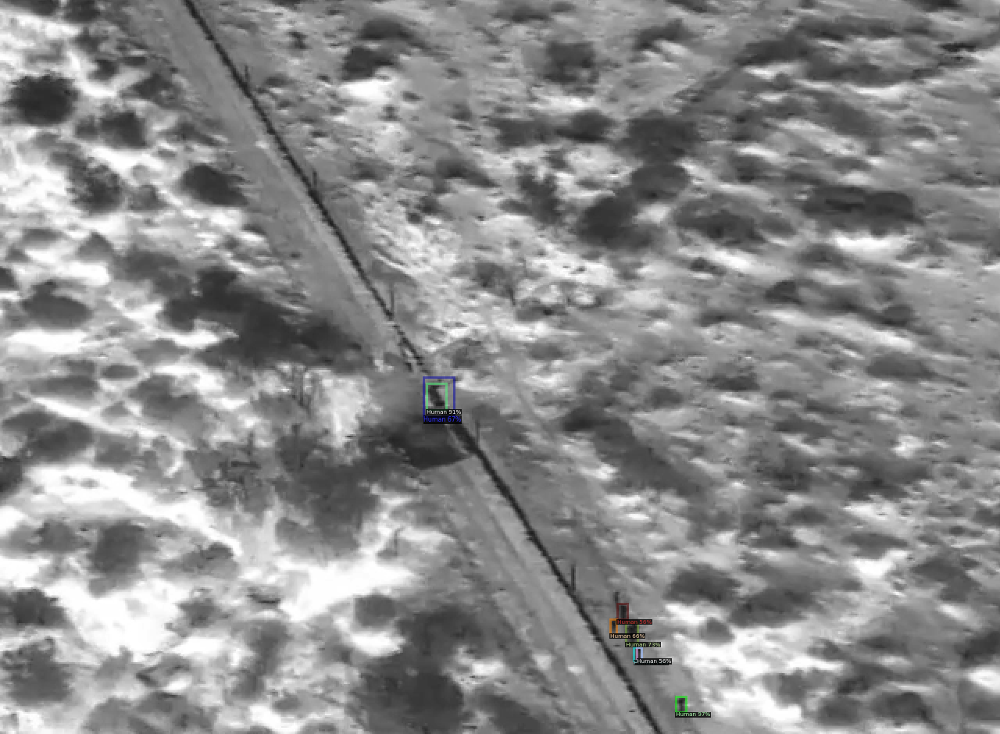

In [ ]:
from detectron2.utils.visualizer import ColorMode

my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
test_dataset_dicts = DatasetCatalog.get("my_dataset_test")
random.seed(9999)
random_test_samples = random.sample(test_dataset_dicts, 3)


print(f"my_dataset_test_metadata: {my_dataset_test_metadata}")
random_test_sample_image_ids = []
for random_test_sample in random_test_samples:
    print(f"random_test_sample: {random_test_sample}")
    random_test_sample_image_ids.append(random_test_sample["image_id"])

for d in random_test_samples:    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_test_metadata, 
                   scale=2.0,
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

## Show ground truth for corresponding test set images

[2659, 725, 793]
loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
imgs: [{'id': 2659, 'width': 640, 'height': 470, 'file_name': 'video82_2_000600.PNG', 'license': 0, 'flickr_url': '', 'coco_url': '', 'date_captured': 0}, {'id': 725, 'width': 640, 'height': 470, 'file_name': 'video82_1_000724.PNG', 'license': 0, 'flickr_url': '', 'coco_url': '', 'date_captured': 0}, {'id': 793, 'width': 640, 'height': 470, 'file_name': 'video82_1_000792.PNG', 'license': 0, 'flickr_url': '', 'coco_url': '', 'date_captured': 0}]
Displaying image: {'id': 2659, 'width': 640, 'height': 470, 'file_name': 'video82_2_000600.PNG', 'license': 0, 'flickr_url': '', 'coco_url': '', 'date_captured': 0} on ax: [<matplotlib.axes._subplots.AxesSubplot object at 0x7fd55c7f5ee0>
TRAIN_IMAGES_PATH: /content/labeled_data/images/test
file_name: video82_2_000600.PNG
Displaying image: {'id': 725, 'width': 640, 'height': 470, 'file_name': 'video82_1_000724.PNG', 'license': 0, 'flickr_url': '', 

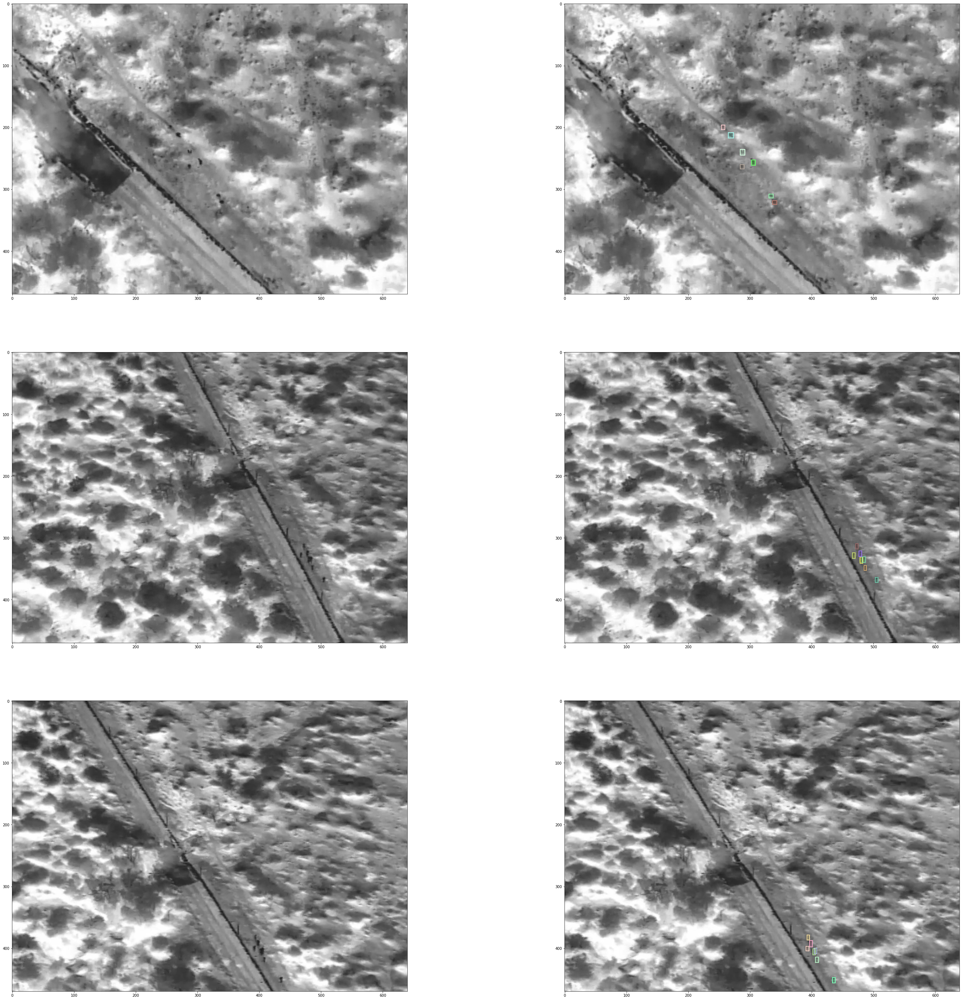

In [ ]:
# Visualise images and annotations
print(random_test_sample_image_ids)
coco_test = COCO(TEST_LABELS) # return dictionary of the dataset
imgs = imgs = coco_test.loadImgs(random_test_sample_image_ids) # load images
print(f"imgs: {imgs}")
_, axs = plt.subplots(len(imgs), 2, figsize=(50, 50))
for img, ax in zip(imgs, axs):
    print(f"Displaying image: {img} on ax: {ax}")
    print(f"TRAIN_IMAGES_PATH: {Path(TEST_IMAGES_PATH)}")
    print(f"file_name: {img['file_name']}")
    # I = io.imread(Path(TEST_IMAGES_PATH)/img['file_name'])
    I = cv2.imread(os.path.join(TEST_IMAGES_PATH, img['file_name']))
    annIds = coco_test.getAnnIds(imgIds=[img['id']])
    anns = coco_test.loadAnns(annIds)
    ax[0].imshow(I)
    ax[1].imshow(I)
    plt.sca(ax[1])
    coco_test.showAnns(anns, draw_bbox=True)